<a href="https://colab.research.google.com/github/AaMNAHZaAFAR/Stock-Market-Prediction/blob/main/stockprediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Import libraries**

In [1]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import time
import datetime

#matplotlib
import matplotlib.pyplot as plt
from matplotlib.pylab import rcParams
%matplotlib inline
rcParams['figure.figsize'] = 15, 6

#seaborn
import seaborn as sns

#ploty
import plotly
import plotly.express as px
plotly.offline.init_notebook_mode(connected=True)
import plotly.offline as py
import plotly.graph_objs as go
import plotly.figure_factory as ff

#bokeh
import holoviews as hv
from holoviews import opts, dim

#sklearn
from sklearn.preprocessing import MinMaxScaler

**Install and Configure Kaggle API in Colab**

In [2]:
# Install Kaggle API
!pip install kaggle

# Create a directory for Kaggle configuration
!mkdir -p ~/.kaggle

# Move the kaggle.json file to the correct location
!cp kaggle.json ~/.kaggle/

# Set the permissions for the file
!chmod 600 ~/.kaggle/kaggle.json


cp: cannot stat 'kaggle.json': No such file or directory
chmod: cannot access '/root/.kaggle/kaggle.json': No such file or directory


**Loading the Dataset**

In [3]:
# Download the dataset from Kaggle
!kaggle datasets download -d dgawlik/nyse

# Unzip the downloaded dataset
!unzip nyse.zip -d nyse_data


Dataset URL: https://www.kaggle.com/datasets/dgawlik/nyse
License(s): CC0-1.0
 91% 28.0M/30.7M [00:02<00:00, 20.5MB/s]
100% 30.7M/30.7M [00:02<00:00, 14.8MB/s]
Archive:  nyse.zip
  inflating: nyse_data/fundamentals.csv  
  inflating: nyse_data/prices-split-adjusted.csv  
  inflating: nyse_data/prices.csv    
  inflating: nyse_data/securities.csv  


In [4]:
prices_split_adjusted = pd.read_csv('nyse_data/prices-split-adjusted.csv',index_col='date', parse_dates=['date'])
prices_split_adjusted.head()
#prices_split_adjusted.info()
#prices_split_adjusted.describe()

,symbol,open,close,low,high,volume
date,,,,,,
2016-01-05,WLTW,123.430000,125.839996,122.309998,126.250000,2163600.0
2016-01-06,WLTW,125.239998,119.980003,119.940002,125.540001,2386400.0
2016-01-07,WLTW,116.379997,114.949997,114.930000,119.739998,2489500.0
2016-01-08,WLTW,115.480003,116.620003,113.500000,117.440002,2006300.0
2016-01-11,WLTW,117.010002,114.970001,114.089996,117.330002,1408600.0


**Data Cleaning**

In [5]:
# Count the number of entries for each symbol
symbol_counts = prices_split_adjusted['symbol'].value_counts()
symbol_counts

symbol
KSU     1762
NOC     1762
ORCL    1762
OMC     1762
OKE     1762
        ... 
KHC      378
HPE      304
CSRA     284
WLTW     251
FTV      126
Name: count, Length: 501, dtype: int64

In [6]:
# Identify symbols with fewer than 1762 entries
omit_symbols = symbol_counts[symbol_counts < 1762].index

# Filter out rows with symbols that have fewer than 1762 entries
prices_split_adjusted = prices_split_adjusted[~prices_split_adjusted['symbol'].isin(omit_symbols)]
prices_split_adjusted.head()

,symbol,open,close,low,high,volume
date,,,,,,
2010-01-04,A,22.453504,22.389128,22.267525,22.625180,3815500.0
2010-01-04,AAL,4.840000,4.770000,4.660000,4.940000,9837300.0
2010-01-04,AAP,40.700001,40.380001,40.360001,41.040001,1701700.0
2010-01-04,AAPL,30.490000,30.572857,30.340000,30.642857,123432400.0
2010-01-04,ABC,26.290001,26.629999,26.139999,26.690001,2455900.0


In [7]:
# Find the top 5 stocks by the number of entries
top_5_stocks = prices_split_adjusted['symbol'].value_counts().head(5)
print(top_5_stocks)

symbol
A      1762
NKE    1762
OMC    1762
OKE    1762
O      1762
Name: count, dtype: int64


In [8]:
# Find the top 5 stocks by the number of entries
top_5_stocks = prices_split_adjusted['symbol'].value_counts().head(5).index

# Display descriptive statistics for each of the top 10 stocks
for stock_name in top_5_stocks:
    stock = prices_split_adjusted[prices_split_adjusted['symbol'] == stock_name]
    print(f"Descriptive statistics for {stock_name}:")
    print(stock.describe())
    print("\n")

Descriptive statistics for A:
              open        close          low         high        volume
count  1762.000000  1762.000000  1762.000000  1762.000000  1.762000e+03
mean     34.065290    34.080221    33.714101    34.414842  3.927589e+06
std       7.438918     7.439467     7.436754     7.446296  2.384677e+06
min      19.334765    19.291845    19.084406    19.706724  5.880000e+05
25%      27.703863    27.687768    27.421316    28.074034  2.297950e+06
50%      34.215157    34.332382    33.844778    34.651903  3.398250e+06
75%      40.559486    40.559486    40.177918    40.885194  4.890125e+06
max      48.630001    48.439999    48.119999    48.630001  2.536860e+07


Descriptive statistics for NKE:
              open        close          low         high        volume
count  1762.000000  1762.000000  1762.000000  1762.000000  1.762000e+03
mean     35.684265    35.690609    35.377259    35.993046  9.502834e+06
std      14.798744    14.779681    14.660918    14.908951  5.590828e+06


**Exploratory Data Analysis**

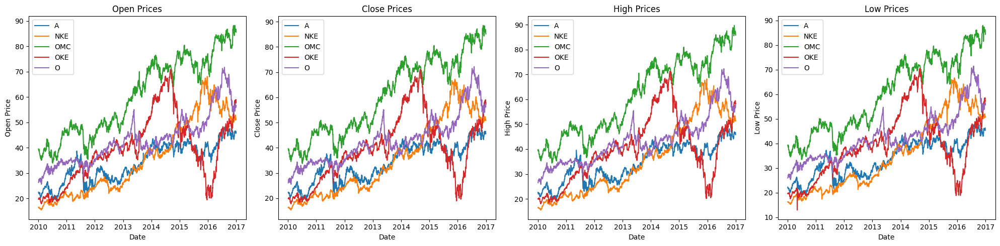

In [17]:
# Function to plot trends of top 5 stocks metrics in a single line
def plot_stock_metrics_in_line(data, stocks, metrics):
    num_metrics = len(metrics)
    fig, axs = plt.subplots(1, num_metrics, figsize=(20, 5))  # Adjust figure size for better fit

    for i, metric in enumerate(metrics):
        for stock_name in stocks:
            stock_data = data[data['symbol'] == stock_name]
            axs[i].plot(stock_data.index, stock_data[metric], label=stock_name)
        axs[i].set_title(f'{metric.capitalize()} Prices')
        axs[i].set_xlabel('Date')
        axs[i].set_ylabel(f'{metric.capitalize()} Price')
        axs[i].legend(loc='best')

    plt.tight_layout()
    plt.show()

# Plot open, close, high, and low for top 5 stocks in a single line
metrics = ['open', 'close', 'high', 'low']
plot_stock_metrics_in_line(prices_split_adjusted, top_5_stocks, metrics)


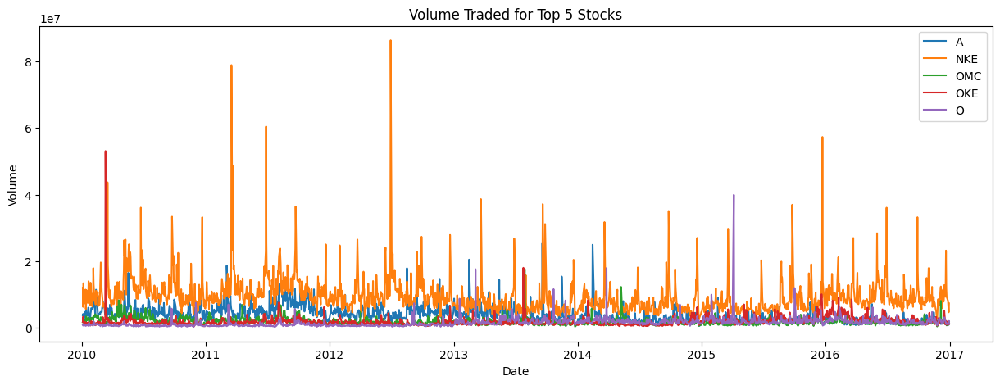

In [18]:
# Volume Analysis
def plot_volume_analysis(data, stocks):
    plt.figure(figsize=(15, 5))
    for stock_name in stocks:
        stock_data = data[data['symbol'] == stock_name]
        plt.plot(stock_data.index, stock_data['volume'], label=stock_name)
    plt.title('Volume Traded for Top 5 Stocks')
    plt.xlabel('Date')
    plt.ylabel('Volume')
    plt.legend(loc='best')
    plt.show()

plot_volume_analysis(prices_split_adjusted, top_5_stocks)

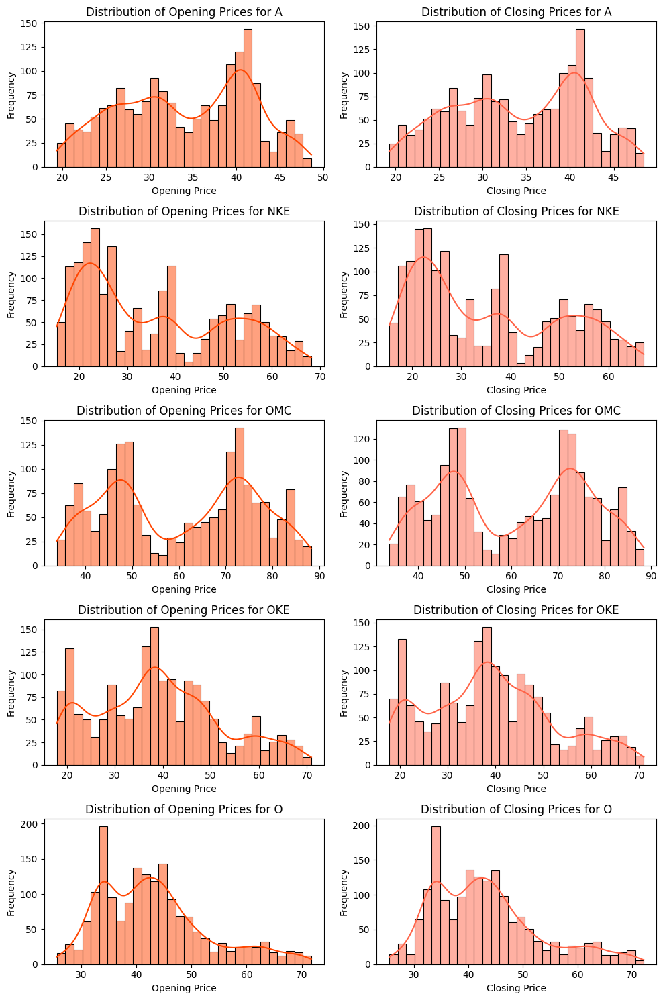

In [34]:
import seaborn as sns
import matplotlib.pyplot as plt

# Distribution of Stock Prices for Open and Close
def plot_distribution(data, stocks):
    fig, axs = plt.subplots(nrows=len(stocks), ncols=2, figsize=(10, len(stocks) * 3))

    # Define a red-orange color palette
    color_palette = ['#FF4500', '#FF6347']  # OrangeRed, Tomato

    for i, stock_name in enumerate(stocks):
        stock_data = data[data['symbol'] == stock_name]

        # Plot distribution of opening prices
        sns.histplot(stock_data['open'], kde=True, bins=30, ax=axs[i, 0], color=color_palette[0])
        axs[i, 0].set_title(f'Distribution of Opening Prices for {stock_name}')
        axs[i, 0].set_xlabel('Opening Price')
        axs[i, 0].set_ylabel('Frequency')

        # Plot distribution of closing prices
        sns.histplot(stock_data['close'], kde=True, bins=30, ax=axs[i, 1], color=color_palette[1])
        axs[i, 1].set_title(f'Distribution of Closing Prices for {stock_name}')
        axs[i, 1].set_xlabel('Closing Price')
        axs[i, 1].set_ylabel('Frequency')

    plt.tight_layout()
    plt.show()

plot_distribution(prices_split_adjusted, top_5_stocks)


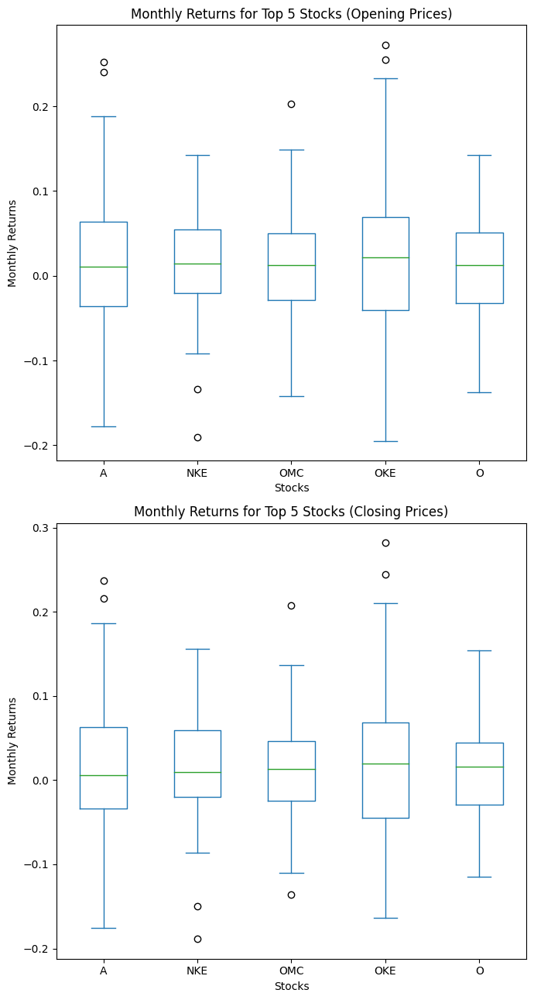

In [33]:
# Monthly Returns Analysis for Open and Close
def plot_monthly_returns(data, stocks):
    monthly_returns_open = {}
    monthly_returns_close = {}

    for stock_name in stocks:
        stock_data = data[data['symbol'] == stock_name]
        monthly_returns_open[stock_name] = stock_data['open'].resample('M').ffill().pct_change()
        monthly_returns_close[stock_name] = stock_data['close'].resample('M').ffill().pct_change()

    monthly_returns_open_df = pd.DataFrame(monthly_returns_open)
    monthly_returns_close_df = pd.DataFrame(monthly_returns_close)

    fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(7, 13))

    # Box plot for monthly returns of opening prices
    monthly_returns_open_df.plot(kind='box', ax=axs[0])
    axs[0].set_title('Monthly Returns for Top 5 Stocks (Opening Prices)')
    axs[0].set_xlabel('Stocks')
    axs[0].set_ylabel('Monthly Returns')

    # Box plot for monthly returns of closing prices
    monthly_returns_close_df.plot(kind='box', ax=axs[1])
    axs[1].set_title('Monthly Returns for Top 5 Stocks (Closing Prices)')
    axs[1].set_xlabel('Stocks')
    axs[1].set_ylabel('Monthly Returns')

    plt.tight_layout()
    plt.show()

plot_monthly_returns(prices_split_adjusted, top_5_stocks)


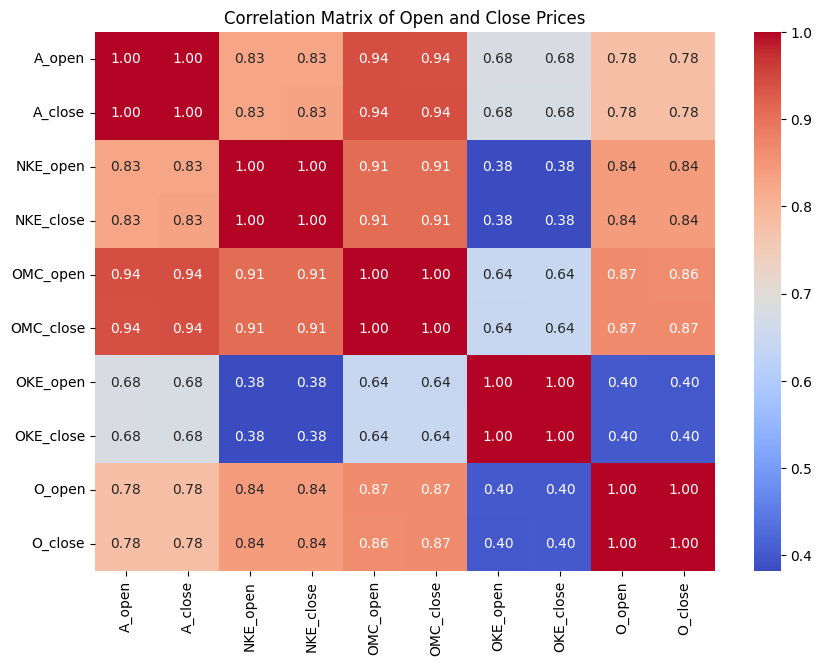

In [35]:
# Correlation Analysis including only open and close prices
def plot_correlation_matrix(data, stocks):
    combined_data = pd.DataFrame()

    # Collect open and close prices for each stock
    for stock_name in stocks:
        stock_data = data[data['symbol'] == stock_name][['open', 'close']].rename(
            columns={'open': f'{stock_name}_open', 'close': f'{stock_name}_close'})
        combined_data = pd.concat([combined_data, stock_data], axis=1)

    # Calculate correlation matrix
    correlation_matrix = combined_data.corr()

    # Plot heatmap
    plt.figure(figsize=(10, 7))
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
    plt.title('Correlation Matrix of Open and Close Prices')
    plt.show()

plot_correlation_matrix(prices_split_adjusted, top_5_stocks)


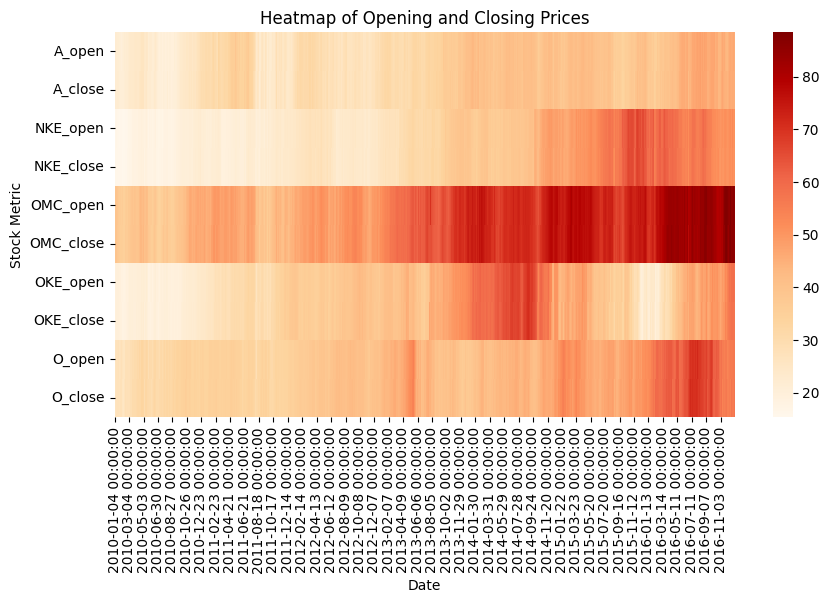

In [27]:
# Heatmap of Opening and Closing Prices
def plot_open_close_prices_heatmap(data, stocks):
    combined_data = pd.DataFrame()

    for stock_name in stocks:
        stock_open = data[data['symbol'] == stock_name]['open'].rename(f'{stock_name}_open')
        stock_close = data[data['symbol'] == stock_name]['close'].rename(f'{stock_name}_close')
        combined_data = pd.concat([combined_data, stock_open, stock_close], axis=1)

    plt.figure(figsize=(10, 5))
    sns.heatmap(combined_data.T, cmap='OrRd', cbar=True)  # Change 'YlGnBu' to 'OrRd'
    plt.title('Heatmap of Opening and Closing Prices')
    plt.xlabel('Date')
    plt.ylabel('Stock Metric')
    plt.show()

plot_open_close_prices_heatmap(prices_split_adjusted, top_5_stocks)


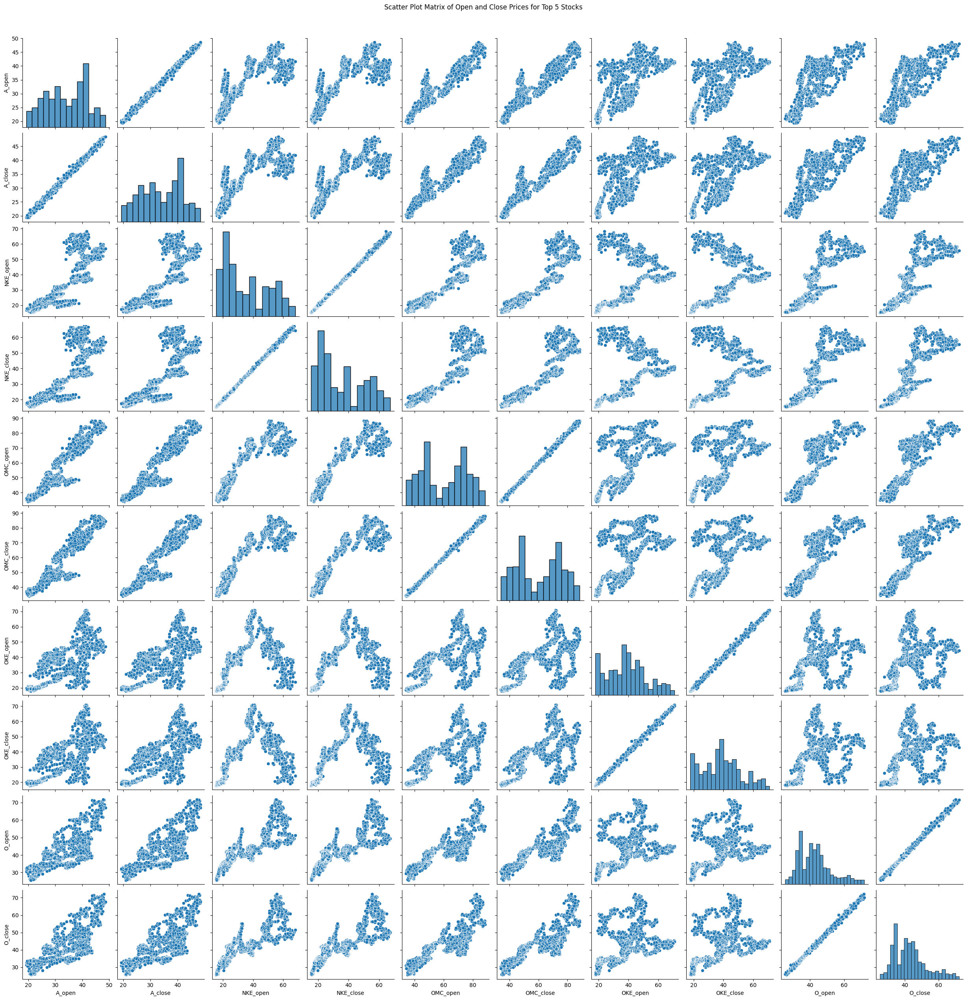

In [37]:
# Scatter Plot Matrix for Open and Close Prices
def plot_scatter_matrix(data, stocks):
    combined_data = pd.DataFrame()

    # Collect open and close prices for each stock
    for stock_name in stocks:
        stock_data = data[data['symbol'] == stock_name][['open', 'close']].rename(
            columns={'open': f'{stock_name}_open', 'close': f'{stock_name}_close'})
        combined_data = pd.concat([combined_data, stock_data], axis=1)

    # Plot scatter plot matrix
    sns.pairplot(combined_data)
    plt.suptitle('Scatter Plot Matrix of Open and Close Prices for Top 5 Stocks', y=1.02)
    plt.show()

plot_scatter_matrix(prices_split_adjusted, top_5_stocks)


**Data Preprocessing**

In [15]:
# Function to handle missing values
def handle_missing_values(data, stocks):
    handled_data = {}
    for stock_name in stocks:
        stock_data = data[data['symbol'] == stock_name].copy()
        print(f"Missing values for {stock_name} before handling:")
        print(stock_data.isna().sum())
        stock_data.fillna(method='ffill', inplace=True)
        stock_data.fillna(method='bfill', inplace=True)
        print(f"Missing values for {stock_name} after handling:")
        print(stock_data.isna().sum())
        handled_data[stock_name] = stock_data
    return handled_data

# Apply handling missing values to the data
handled_data = handle_missing_values(prices_split_adjusted, top_5_stocks)


Missing values for A before handling:
symbol    0
open      0
close     0
low       0
high      0
volume    0
dtype: int64
Missing values for A after handling:
symbol    0
open      0
close     0
low       0
high      0
volume    0
dtype: int64
Missing values for NKE before handling:
symbol    0
open      0
close     0
low       0
high      0
volume    0
dtype: int64
Missing values for NKE after handling:
symbol    0
open      0
close     0
low       0
high      0
volume    0
dtype: int64
Missing values for OMC before handling:
symbol    0
open      0
close     0
low       0
high      0
volume    0
dtype: int64
Missing values for OMC after handling:
symbol    0
open      0
close     0
low       0
high      0
volume    0
dtype: int64
Missing values for OKE before handling:
symbol    0
open      0
close     0
low       0
high      0
volume    0
dtype: int64
Missing values for OKE after handling:
symbol    0
open      0
close     0
low       0
high      0
volume    0
dtype: int64
Missing 

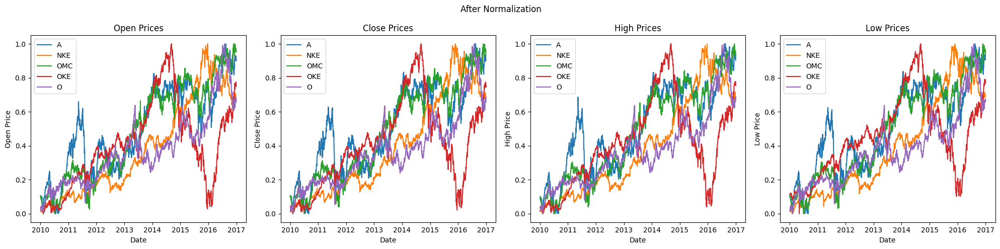

In [21]:
# Function to normalize data
def normalize_data(data, stocks):
    scaler = MinMaxScaler()
    normalized_data = {}
    for stock_name in stocks:
        stock_data = data[stock_name].copy()
        stock_data[['open', 'close', 'high', 'low']] = scaler.fit_transform(stock_data[['open', 'close', 'high', 'low']])
        normalized_data[stock_name] = stock_data
    return normalized_data

# Function to plot different stock metrics in a single line
def plot_stock_metrics(data, stocks, metrics, title):
    num_metrics = len(metrics)
    fig, axs = plt.subplots(1, num_metrics, figsize=(20, 5))  # Adjust figure size for better fit

    for i, metric in enumerate(metrics):
        for stock_name in stocks:
            stock_data = data[stock_name]
            axs[i].plot(stock_data.index, stock_data[metric], label=stock_name)
        axs[i].set_title(f'{metric.capitalize()} Prices')
        axs[i].set_xlabel('Date')
        axs[i].set_ylabel(f'{metric.capitalize()} Price')
        axs[i].legend(loc='best')

    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

# Normalize the data
normalized_data = normalize_data(handled_data, top_5_stocks)


# Plot open, close, high, and low for top 5 stocks after normalization
metrics = ['open', 'close', 'high', 'low']
plot_stock_metrics(normalized_data, top_5_stocks, metrics, 'After Normalization')

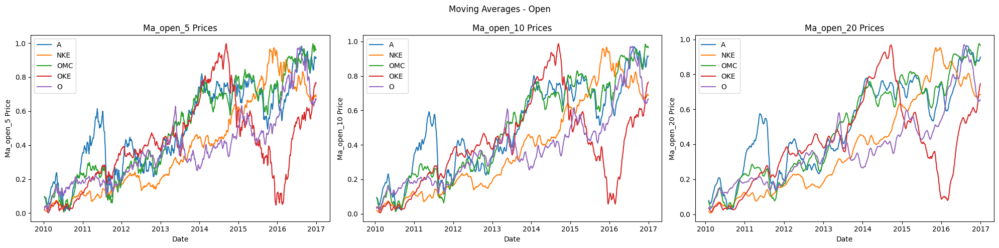

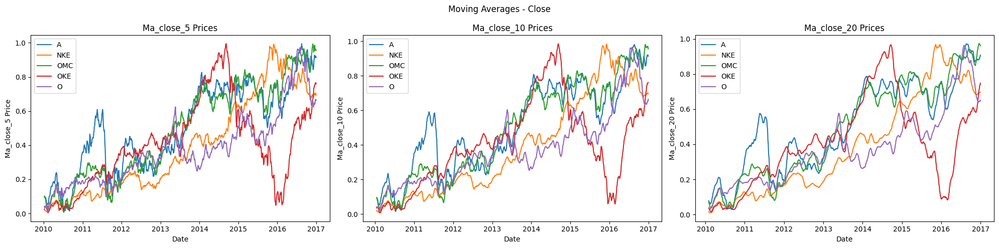

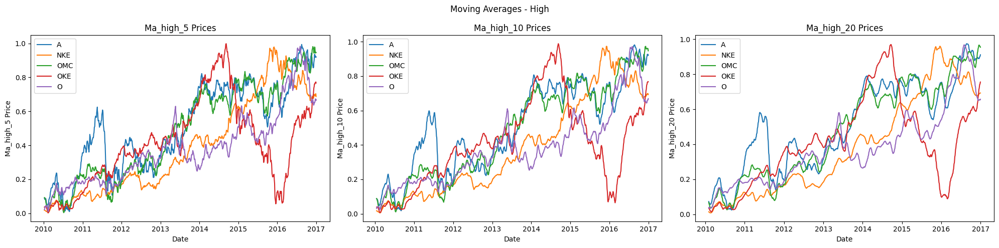

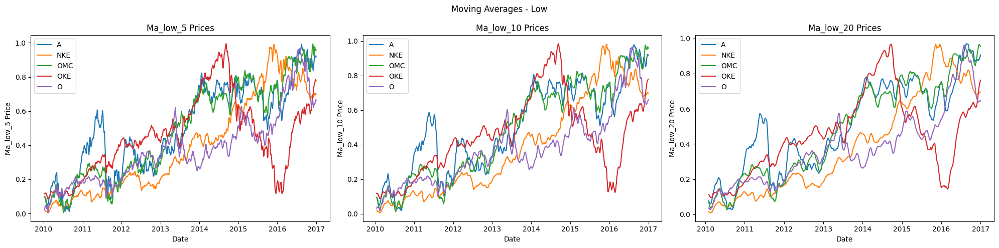

In [23]:
# Add moving averages for open, close, high, and low
def add_moving_averages_all_metrics(data, stocks):
    ma_data = {}
    for stock_name in stocks:
        stock_data = data[stock_name].copy()
        for metric in ['open', 'close', 'high', 'low']:
            stock_data[f'MA_{metric}_5'] = stock_data[metric].rolling(window=5).mean()
            stock_data[f'MA_{metric}_10'] = stock_data[metric].rolling(window=10).mean()
            stock_data[f'MA_{metric}_20'] = stock_data[metric].rolling(window=20).mean()
        ma_data[stock_name] = stock_data
    return ma_data

# Function to plot moving averages for different stock metrics
def plot_moving_averages(data, stocks, metrics):
    for metric in metrics:
        plot_stock_metrics(data, stocks, [f'MA_{metric}_5', f'MA_{metric}_10', f'MA_{metric}_20'], f'Moving Averages - {metric.capitalize()}')

# Add moving averages for open, close, high, and low
ma_data_all_metrics = add_moving_averages_all_metrics(normalized_data, top_5_stocks)

# Plot moving averages for open, close, high, and low
metrics = ['open', 'close', 'high', 'low']
plot_moving_averages(ma_data_all_metrics, top_5_stocks, metrics)


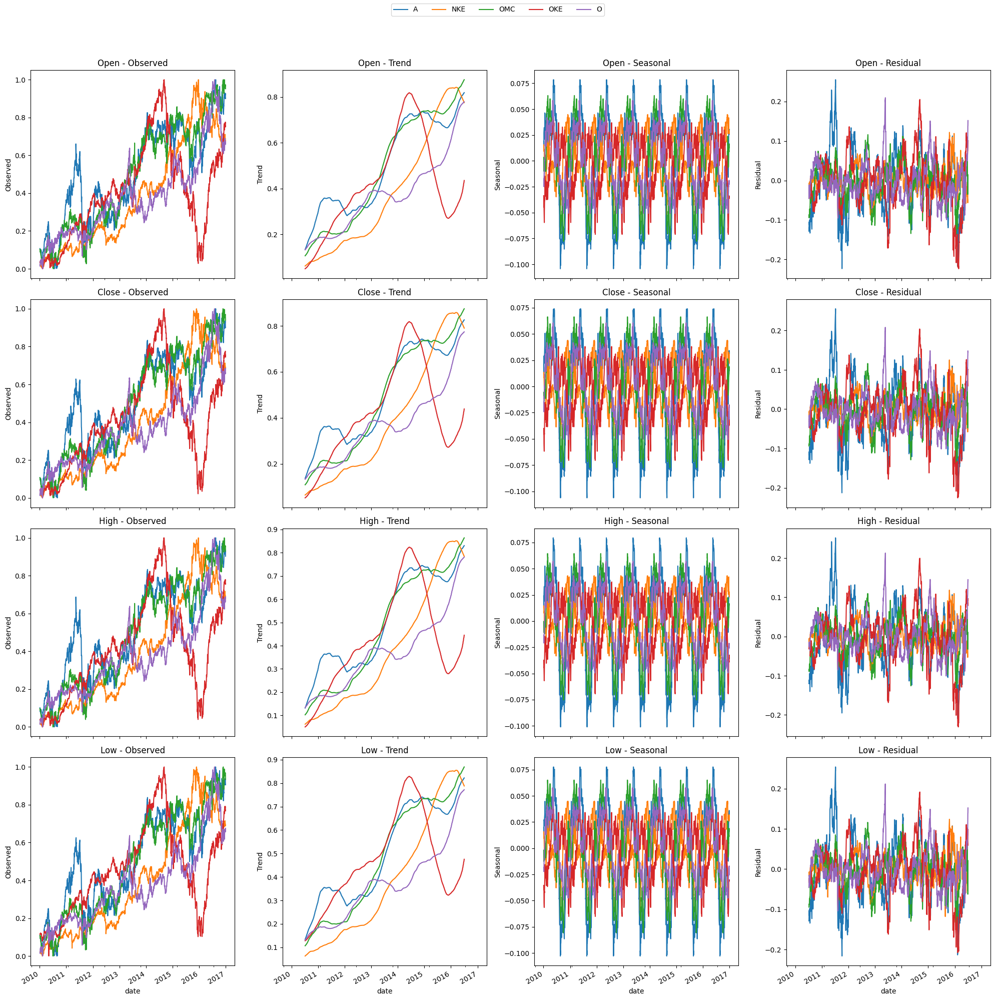

In [24]:
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

# Function to decompose time series data for all metrics and plot in a single figure for all stocks
def decompose_and_plot_all_stocks(data, stocks, metrics):
    fig, axs = plt.subplots(len(metrics), 4, figsize=(20, len(metrics) * 5), sharex=True)

    for i, metric in enumerate(metrics):
        for stock in stocks:
            result = seasonal_decompose(data[stock][metric], model='additive', period=252)

            result.observed.plot(ax=axs[i, 0], label=stock)
            axs[i, 0].set_ylabel('Observed')
            axs[i, 0].set_title(f'{metric.capitalize()} - Observed')

            result.trend.plot(ax=axs[i, 1], label=stock)
            axs[i, 1].set_ylabel('Trend')
            axs[i, 1].set_title(f'{metric.capitalize()} - Trend')

            result.seasonal.plot(ax=axs[i, 2], label=stock)
            axs[i, 2].set_ylabel('Seasonal')
            axs[i, 2].set_title(f'{metric.capitalize()} - Seasonal')

            result.resid.plot(ax=axs[i, 3], label=stock)
            axs[i, 3].set_ylabel('Residual')
            axs[i, 3].set_title(f'{metric.capitalize()} - Residual')

    handles, labels = axs[0, 0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper center', ncol=len(stocks))
    plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust the layout to make room for the legend
    plt.show()

# Decompose and plot the metrics for the top 5 stocks
metrics = ['open', 'close', 'high', 'low']  # Include all relevant metrics

decompose_and_plot_all_stocks(normalized_data, top_5_stocks, metrics)


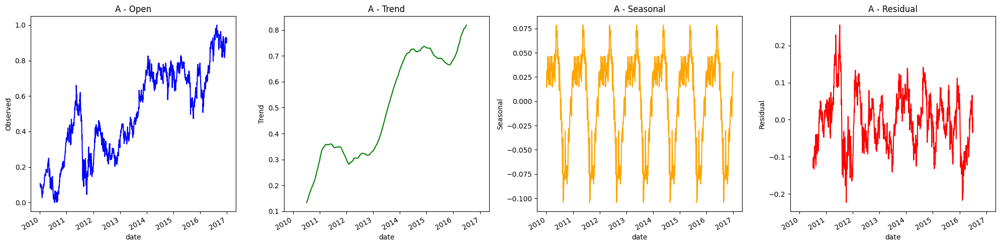

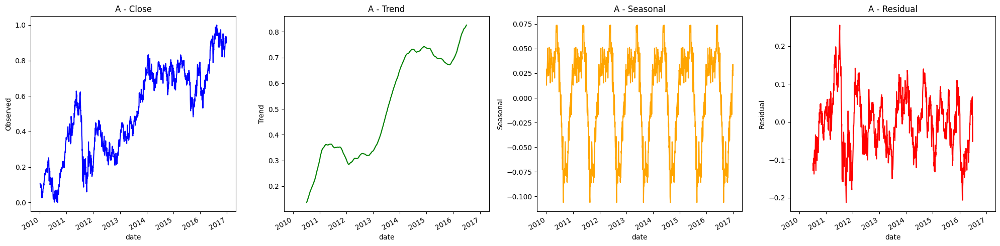

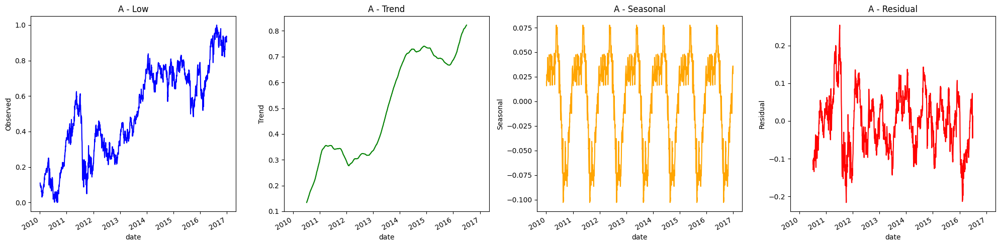

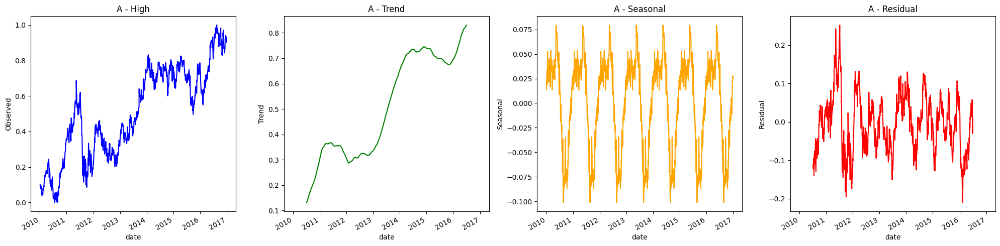

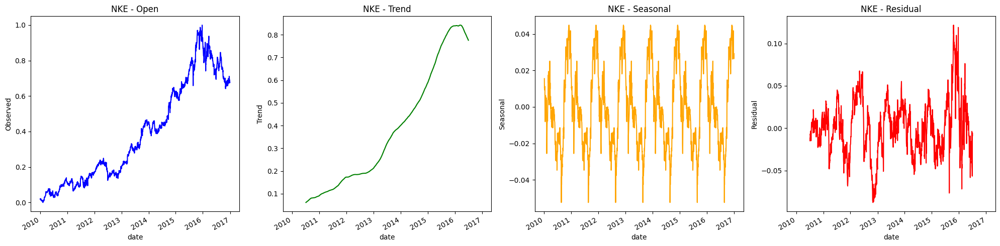

...

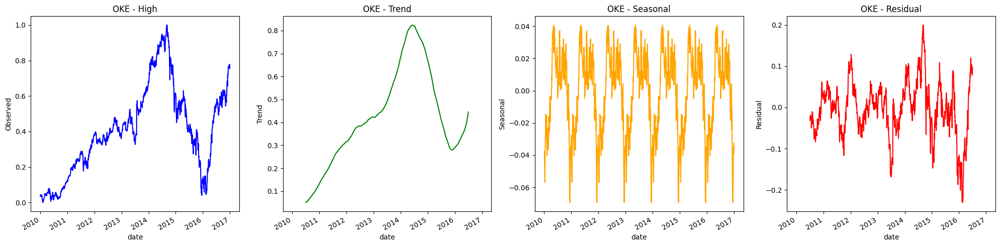

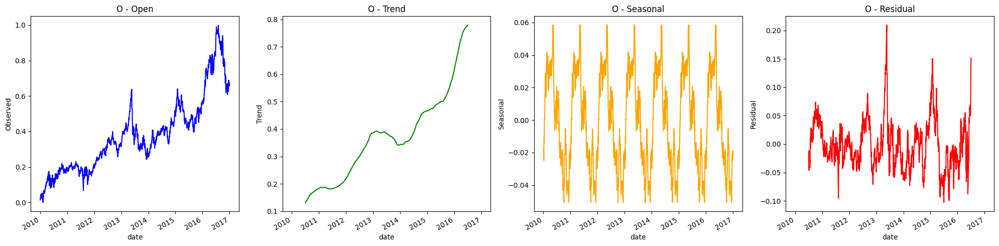

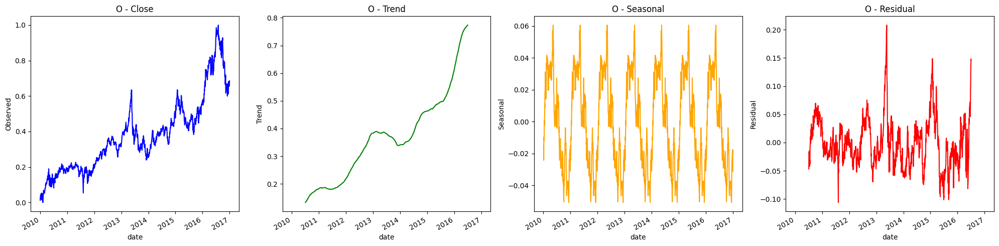

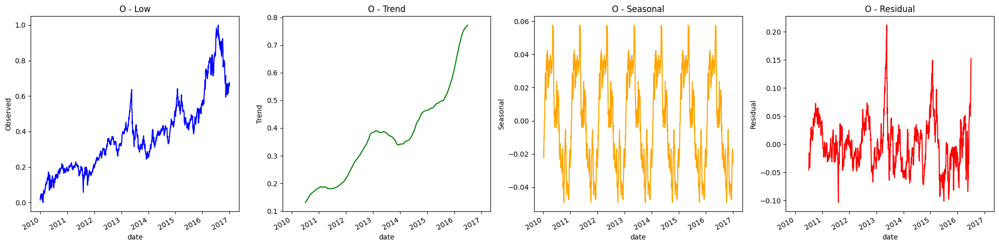

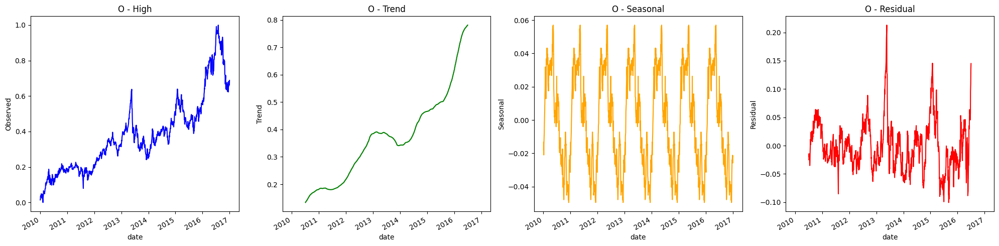

In [25]:
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

# Function to decompose time series data and plot in a single row
def decompose_time_series_single_row(data, stock, metric):
    result = seasonal_decompose(data[stock][metric], model='additive', period=252)  # Using a period of 252 trading days
    fig, axs = plt.subplots(1, 4, figsize=(20, 5), sharex=True)

    result.observed.plot(ax=axs[0], color='blue')
    axs[0].set_ylabel('Observed')
    axs[0].set_title(f'{stock} - {metric.capitalize()}')

    result.trend.plot(ax=axs[1], color='green')
    axs[1].set_ylabel('Trend')
    axs[1].set_title(f'{stock} - Trend')

    result.seasonal.plot(ax=axs[2], color='orange')
    axs[2].set_ylabel('Seasonal')
    axs[2].set_title(f'{stock} - Seasonal')

    result.resid.plot(ax=axs[3], color='red')
    axs[3].set_ylabel('Residual')
    axs[3].set_title(f'{stock} - Residual')

    plt.tight_layout()
    plt.show()

# Decompose the metrics of the top 5 stocks
metrics = ['open', 'close', 'low', 'high']  # Use 'close' as the metric for simplicity

for stock_name in top_5_stocks:
    for metric in metrics:
        decompose_time_series_single_row(normalized_data, stock_name, metric)
